# Assignment 2 
AI for Urban Sustainability

Lu Yii Wong

10 Feb 2025

## Notebook Set-up

In [3]:
# Importing all necessary libraries
## Lab 2 - Exercise 3
import fiona
from fiona.crs import to_string
from shapely.geometry import mapping, shape
import pandas as pd
import geopandas as gpd
from geopandas import GeoDataFrame as gdf
from shapely.geometry import shape, Point, Polygon, mapping
import numpy as np
import pyproj
from pyproj import Transformer, transform
from itertools import repeat
import sys
import time
import rtree
from statistics import median
from shapely.ops import transform
from functools import partial



## Lab 3 - Exercise 1
import os, os.path
from pystac_client import Client
import planetary_computer as pc
import rioxarray
import rasterio as rio
import fiona
from functools import partial
from shapely.ops import transform
import urllib.request
import pyproj
import pystac_client
import planetary_computer
import argparse
import geopandas as gpd
from matplotlib import pyplot as plt

## Lab 3 - Exercise 2
import rasterio as rio
import rasterio
from rasterio.plot import show
from rasterio.mask import mask
from rasterio.windows import get_data_window
from rasterio.windows import Window
from rasterio.merge import merge
# optional - turn off warnings
import warnings
warnings.filterwarnings('ignore')


## Lab 3 - Exercise 3
from rasterio.merge import merge
import glob

## Lab 2 Exercise 3

### Checking data 

In [4]:
census_shp = 'data-lab2/philadelphia-census-tract.shp'

with fiona.open(census_shp, 'r') as nb_lyr:
    driver = nb_lyr.driver # the driver of the shapefile
    schema = nb_lyr.schema  #schema of shapefile
    crs = nb_lyr.crs   # coordinate reference system of the shapefile
    meta = nb_lyr.meta # more details about the metadata of the shapefile

print ('The driver is:', driver)
print ('The schema is:', schema)
print ('The coordinate reference system is:', crs)
print ('the metadata is:', meta)

The driver is: ESRI Shapefile
The schema is: {'properties': {'STATEFP': 'str:80', 'COUNTYFP': 'str:80', 'TRACTCE': 'str:80', 'GEOID': 'str:80', 'NAME_x': 'str:80', 'NAMELSAD': 'str:80', 'MTFCC': 'str:80', 'FUNCSTAT': 'str:80', 'ALAND': 'int:18', 'AWATER': 'int:18', 'INTPTLAT': 'str:80', 'INTPTLON': 'str:80', 'NAME_y': 'str:80', 'GEO_ID': 'str:80', 'white_popu': 'str:80', 'non-hispan': 'str:80', 'black_popu': 'str:80', 'asian_popu': 'str:80', 'hispanic_p': 'str:80', 'total_popu': 'str:80', 'median_hou': 'str:80', 'per_capita': 'str:80', 'built_age': 'str:80', 'less_highs': 'str:80', 'bachelor': 'str:80', 'totaleduca': 'str:80', 'male_und18': 'str:80', 'female_und': 'str:80', 'male65_66': 'str:80', 'male67_69': 'str:80', 'male70_74': 'str:80', 'male75_79': 'str:80', 'male80_84': 'str:80', 'male85_': 'str:80', 'fema_65_66': 'str:80', 'fema_67_69': 'str:80', 'fema70_74': 'str:80', 'fema75_79': 'str:80', 'fema80_84': 'str:80', 'fema85_': 'str:80', 'state': 'str:80', 'county': 'str:80', 'tra

In [5]:
with fiona.open(census_shp, 'r') as nb_lyr:
    for feat in nb_lyr:
        # attribute of the neighborhood features
        attr = feat['properties']
        name = attr['TRACTCE']  #you can find other attribute based on the metadata of the shapefile
#        print ('The neighborhod is:', name)

        # get the geometry of the polygon feature
        geom = feat['geometry']
#         print ('geom is:', geom)

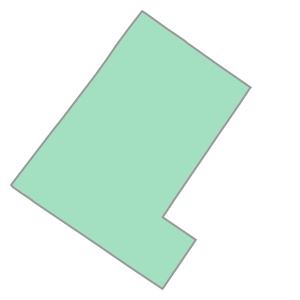

In [7]:
# Print shapes
# the shape is a function in shapely, we import "from shapely.geometry import shape"
shape(geom)

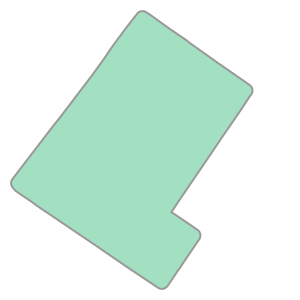

In [6]:
# Print with buffer
buff_geom = shape(geom).buffer(100)
buff_geom
# mapping(shape(point['geometry']).buffer(5.0))

### Create Shapefile from csv

In [8]:
# read the csv file and create shapefile
coffee_shop_csv = 'data-lab2/cambridge_coffee_shops.csv'
coffee_shop_sheet = pd.read_csv(coffee_shop_csv)
# coffee_shop_sheet

In [9]:
# this will print the first 10 records of the data frame
coffee_shop_sheet.head(10)

,id,name,address,city,state,zip,lat,lon
0,1,1369 Coffee House,1369 Cambridge St,Cambridge,MA,2139,42.373695,-71.100440
1,2,1369 Coffee House,757 Massachusetts Ave,Cambridge,MA,2139,42.366432,-71.105430
2,3,Aceituna Cafe,605 W Kendall St,Cambridge,MA,2142,42.364370,-71.081924
3,4,Al's Deli Cafe-Cambridge,1354 Massachusetts Ave,Cambridge,MA,2138,42.373238,-71.118340
4,5,Algiers Coffee House,40 Brattle St # 3,Cambridge,MA,2138,42.373840,-71.121380
5,6,Area Four,500 Technology Sq,Cambridge,MA,2139,42.363420,-71.091286
6,7,B & B Snack Bar,55 Broadway,Cambridge,MA,2142,42.363410,-71.086020
7,8,Basha Cafe,26 New St,Cambridge,MA,2138,42.387756,-71.140830
8,9,Beantowne Coffee House,1 Kendall Sq # B2105,Cambridge,MA,2139,42.366606,-71.090858
9,10,Boston Tea Stop,54 Jfk St # 1,Cambridge,MA,2138,42.371980,-71.120670


In [11]:
# deprecated version
crs = {'init': 'epsg:4326'} #http://www.spatialreference.org/ref/epsg/2263/

# current and recommended syntax for specifying crs however, the older version of Fiona may not write the .prj file correctly for the new syntax to work
# crs = {'epsg': 4326} #http://www.spatialreference.org/ref/epsg/2263/

# create a geo-dataframe
points_gdf= gdf(coffee_shop_sheet, crs=crs, \
                geometry=gpd.points_from_xy(coffee_shop_sheet.lon, coffee_shop_sheet.lat))

# save the geo-dataframe as a shapefile
points_gdf.to_file("data-lab2/coffe_shop.shp")

In [13]:
# prepare the schema and crs of the output shapefile
schema = {
    'geometry': 'Point',
    'properties': {
        'id': 'str: 20',
        'name': 'str: 20',
        'address': 'str: 20',
        'city': 'str: 20',
        'state':'str: 20',
        'zip': 'str: 7'
    }
}

# u prefix is used here for Unicode string
crs = {'init': u'epsg:4326'}

# The output shapefile
coffee_shop_shp = 'data/cambridge_coffee_shops2.shp' 

with fiona.open(coffee_shop_shp, 'w', driver = "ESRI Shapefile", crs = crs, schema=schema) as output:
    for row in coffee_shop_sheet.itertuples():
        lon = row[8]
        lat = row[7]
        
        id_ = row[1]
        name = row[2]
        address = row[3]
        city = row[4]
        state = row[5]
        zipcode = row[6]
        
        point = Point(float(lon), float(lat))
        output.write({'properties':{'id': id_,
                                    'name': name,
                                    'address': address,
                                    'city': city,
                                    'state': state,
                                    'zip': zipcode
                                    },
                      'geometry': mapping(point)
                     })
        
print ('You have exported the shapefile successfully')

You have exported the shapefile successfully


In [14]:
row

Pandas(Index=82, id=83, name='Bourbon Coffee', address='1815 Massachusetts Ave', city='Cambridge', state='MA', zip=2140, lat=42.3873, lon=-71.118901)

### Change projections

In [15]:
transformer = Transformer.from_crs(2263, 4326)

x_coords = 80481
y_coords = 224831

transformer = Transformer.from_crs(2263, 4326)
transformer.transform(x_coords, y_coords)

(40.73759340928409, -77.26199309733204)

In [16]:
transformer = Transformer.from_crs(4326, 6492)
crs = {'init': 'epsg:6492'}

coffee_shop_shp = 'data/cambridge_coffee_shops2.shp' 
coffee_shop_shp_reproj = 'data/cambridge_coffee_shops2_massproj.shp'    


# write the reprojected point feature to shapefile
with fiona.open(coffee_shop_shp) as source:
    schema = source.schema
        
    with fiona.open(coffee_shop_shp_reproj, 'w', driver=source.driver, crs=crs,schema=schema) as dest:
        for feat in source:
            feat_geom = feat['geometry']
            data = feat['properties']
            coordinates = feat_geom['coordinates']
            print(coordinates)
            
            # Transform the coordinates of every ring.
            reprojCoords = transformer.transform(coordinates[1], coordinates[0])
            
            # copy the geom object, but update the reprojected coordinate
            reproj_geom = feat_geom
            reproj_geom['coordinates'] = reprojCoords
            
            dest.write({'geometry': mapping(shape(reproj_geom)),'properties': data})
            

(-71.10044, 42.373695)
(-71.10543, 42.366432)
(-71.081924, 42.36437)
(-71.11834, 42.373238)
(-71.12138, 42.37384)
(-71.091286, 42.36342)
(-71.08602, 42.36341)
(-71.14083, 42.387756)
(-71.090858, 42.366606)
(-71.12067, 42.37198)
(-71.11313, 42.374096)
(-71.12708, 42.39454)
(-71.1157, 42.371605)
(-71.11851, 42.38885)
(-71.09102, 42.37246)
(-71.099236, 42.36276)
(-71.12187, 42.375237)
(-71.121185, 42.37364)
(-71.11014, 42.36896)
(-71.12072, 42.374268)
(-71.124954, 42.37409)
(-71.1095, 42.374847)
(-71.08831, 42.36659)
(-71.08262, 42.362)
(-71.11892, 42.38863)
(-71.076715, 42.36858)
(-71.093704, 42.372818)
(-71.11141, 42.369423)
(-71.14297, 42.389206)
(-71.094, 42.36653)
(-71.13211, 42.398865)
(-71.07953, 42.37242)
(-71.14183, 42.39465)
(-71.1415, 42.387127)
(-71.12106, 42.37413)
(-71.10325, 42.365105)
(-71.12099, 42.371624)
(-71.11589, 42.36088)
(-71.0942, 42.359676)
(-71.12099, 42.371624)
(-71.10432, 42.370617)
(-71.093605, 42.366386)
(-71.13474, 42.402267)
(-71.114914, 42.37314)
(-71.142

In [18]:
# Optimizing traffic accident file for reprojection
t0 = time.time()
traffic_accident = 'data-lab2/crash_data_collision_crash_2007_2017.shp'

layer = fiona.open(traffic_accident)
crs = layer.crs
schema = layer.schema

for feat in layer:
    feat_geom = feat['geometry']
    coordinates = feat_geom['coordinates']

print(time.time() - t0)

4.294586896896362


In [19]:
# Reprojecting traffic accident file to match census tract file
# the name of the output reprojected shapefile
trafficAccident_reproj = 'data-lab2/crash_data_collision_crash_2007_2017_reproj.shp'
transformer = Transformer.from_crs(4326, 2272)

# write the reprojected point feature to shapefile
with fiona.open(traffic_accident) as source:
    crs={'init': 'epsg:2272'}
    schema = source.schema
    
    with fiona.open(trafficAccident_reproj, 'w', driver=source.driver, \
                    crs=crs,schema=schema) as dest:
        for feat in source:
            feat_geom = feat['geometry']
            data = feat['properties']
            
            coordinates = feat_geom['coordinates']
            #print(coordinates)
            # Transform the coordinates of every ring.
            reprojCoords = transformer.transform(coordinates[1], coordinates[0])
            
            reproj_geom = {
                'type': feat_geom['type'],  # Preserve original geometry type
                'coordinates': reprojCoords    # Use new reprojected coordinates
            }
            
            dest.write({'geometry': mapping(shape(reproj_geom)),'properties': data})
            

### R-tree for Overlay

In [20]:
# Create variables from shpfiles 
neighborhood_shp = 'data-lab2/philadelphia-census-tract.shp'
trafficAccident_reproj = 'data-lab2/crash_data_collision_crash_2007_2017_reproj.shp'
outPolygonShp = 'data-lab2/census-traffic-accident.shp'

t0 = time.time()
pnt_lyr = fiona.open(trafficAccident_reproj, 'r')     
# create an empty spatial index object
index = rtree.index.Index()


# populate the spatial index, the polygon features
i = 0
for fid, feature in pnt_lyr.items():
    i = i + 1
    if i % 10000 == 0: print (i)
    geometry = shape(feature['geometry'])
    
    # add a buffer in order to create a r-tree
    geometry_buffered = geometry.buffer(10) 
    geotype = feature['geometry']['type']
    
    index.insert(fid, geometry_buffered.bounds)

10000
20000
30000
40000
50000
60000
70000


In [21]:
pnt_lyr.crs
# loop all polygons and assign GVI values
with fiona.open(neighborhood_shp, 'r') as polygon_lyr:
    schema = polygon_lyr.schema.copy()
    schema['properties']['AcciNum']='float' 
    input_crs = polygon_lyr.crs

In [22]:
polygon_lyr.crs
pnt_lyr.crs

CRS.from_epsg(2272)

In [23]:
# loop all polygons and assign GVI values
with fiona.open(neighborhood_shp, 'r') as polygon_lyr:
    schema = polygon_lyr.schema.copy()
    schema['properties']['AcciNum']='float' 
    input_crs = polygon_lyr.crs
    
    # write the intersected point into the new shapefile
    with fiona.open(outPolygonShp, 'w', 'ESRI Shapefile', schema, input_crs) as output:
        
        # loop the polygon feature
        for idx, featPoly in enumerate(polygon_lyr):
            print('Polygon:', idx)
            geomPoly = shape(featPoly['geometry'])                
            attriPoly = featPoly['properties']
            
            # using the bounding box to find the close but may not intersected point feature
            fids = [int(i) for i in index.intersection(geomPoly.bounds)]
            
            # count the number of accidents
            count = 0
            
            # loop all features in bounding box and then judge if they are intersected
            for fid in fids:
                featPnt = pnt_lyr[fid]
                geomPnt = shape(featPnt['geometry'])
                
                # if the point is intersected with the polygon, then save the point feature into the output shapefile
                if geomPoly.intersects(geomPnt):
                    count = count + 1
            
            attriPoly['AcciNum']=count
            output.write({'geometry': mapping(geomPoly),'properties': attriPoly})
            

Polygon: 0
Polygon: 1
Polygon: 2
Polygon: 3
Polygon: 4
Polygon: 5
Polygon: 6
Polygon: 7
Polygon: 8
Polygon: 9
Polygon: 10
Polygon: 11
Polygon: 12
Polygon: 13
Polygon: 14
Polygon: 15
Polygon: 16
Polygon: 17
Polygon: 18
Polygon: 19
Polygon: 20
Polygon: 21
Polygon: 22
Polygon: 23
Polygon: 24
Polygon: 25
Polygon: 26
Polygon: 27
Polygon: 28
Polygon: 29
Polygon: 30
Polygon: 31
Polygon: 32
Polygon: 33
Polygon: 34
Polygon: 35
Polygon: 36
Polygon: 37
Polygon: 38
Polygon: 39
Polygon: 40
Polygon: 41
Polygon: 42
Polygon: 43
Polygon: 44
Polygon: 45
Polygon: 46
Polygon: 47
Polygon: 48
Polygon: 49
Polygon: 50
Polygon: 51
Polygon: 52
Polygon: 53
Polygon: 54
Polygon: 55
Polygon: 56
Polygon: 57
Polygon: 58
Polygon: 59
Polygon: 60
Polygon: 61
Polygon: 62
Polygon: 63
Polygon: 64
Polygon: 65
Polygon: 66
Polygon: 67
Polygon: 68
Polygon: 69
Polygon: 70
Polygon: 71
Polygon: 72
Polygon: 73
Polygon: 74
Polygon: 75
Polygon: 76
Polygon: 77
Polygon: 78
Polygon: 79
Polygon: 80
Polygon: 81
Polygon: 82
Polygon: 83
Po

In [24]:
featPnt['properties']['crash_year']

2011

## Lab 3 Exercise 1

In [25]:
# Set up key
## https://planetarycomputer.microsoft.com/dataset/naip#Example-Notebook
# Set the environment variable PC_SDK_SUBSCRIPTION_KEY, or set it here.
# The Hub sets PC_SDK_SUBSCRIPTION_KEY automatically.
pc.settings.set_subscription_key("st=2022-06-01T22%3A55%3A32Z&se=2022-06-02T23%3A40%3A32Z&sp=rl&sv=2020-06-12&sr=c&skoid=c85c15d6-d1ae-42d4-af60-e2ca0f81359b&sktid=72f988bf-86f1-41af-91ab-2d7cd011db47&skt=2022-06-02T20%3A23%3A33Z&ske=2022-06-09T20%3A23%3A33Z&sks=b&skv=2020-06-12&sig=U5e1SoZGZqIcunum5BKWcmsVi2bmS1tBsr94LPI%2BLoc%3D")

catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

In [26]:
# Checking Meta data for Hoboken

shpfile = 'data/Hoboken_Boundary/Hoboken_Boundary.shp'

with fiona.open(shpfile, 'r') as nb_lyr:
    driver = nb_lyr.driver # the driver of the shapefile
    schema = nb_lyr.schema  #schema of shapefile
    crs = nb_lyr.crs   # coordinate reference system of the shapefile
    meta = nb_lyr.meta # more details about the metadata of the shapefile


print ('The driver is:', driver)
print ('The schema is:', schema)
print ('The coordinate reference system is:', crs)
print ('the metadata is:', meta)

The driver is: ESRI Shapefile
The schema is: {'properties': {'MUN': 'str:28', 'COUNTY': 'str:10', 'MUN_LABEL': 'str:35', 'MUN_TYPE': 'str:12', 'NAME': 'str:40', 'GNIS_NAME': 'str:35', 'GNIS': 'str:8', 'SSN': 'str:4', 'MUN_CODE': 'str:4', 'KEY': 'str:10', 'CENSUS2010': 'str:10', 'ACRES': 'float:19.8', 'SQ_MILES': 'float:19.8', 'POP2010': 'int:9', 'POP2000': 'int:9', 'POP1990': 'int:9', 'POP1980': 'int:9', 'POPDEN2010': 'int:9', 'POPDEN2000': 'int:9', 'POPDEN1990': 'int:9', 'POPDEN1980': 'int:9', 'SHAPE_AREA': 'float:19.11', 'SHAPE_LEN': 'float:19.11'}, 'geometry': 'Polygon'}
The coordinate reference system is: EPSG:3424
the metadata is: {'driver': 'ESRI Shapefile', 'schema': {'properties': {'MUN': 'str:28', 'COUNTY': 'str:10', 'MUN_LABEL': 'str:35', 'MUN_TYPE': 'str:12', 'NAME': 'str:40', 'GNIS_NAME': 'str:35', 'GNIS': 'str:8', 'SSN': 'str:4', 'MUN_CODE': 'str:4', 'KEY': 'str:10', 'CENSUS2010': 'str:10', 'ACRES': 'float:19.8', 'SQ_MILES': 'float:19.8', 'POP2010': 'int:9', 'POP2000': 'in

In [27]:
# using Hoboken, NJ shapefile

lyr = fiona.open(shpfile)
for feat in lyr:
    area_of_interest_city = feat['geometry']


left, bottom, right, top = lyr.bounds
area_of_interest = {
    "type": "Polygon",
    "coordinates": [
        [
            [left, bottom],
            [right, bottom],
            [right, top],
            [left, top],
            [left, bottom],
        ]
    ],
}

print(area_of_interest)

{'type': 'Polygon', 'coordinates': [[[618517.1466704272, 692465.6490851045], [624994.3420493416, 692465.6490851045], [624994.3420493416, 701710.7421434373], [618517.1466704272, 701710.7421434373], [618517.1466704272, 692465.6490851045]]]}


In [28]:
# Change the projection of the area_of_interest to ESPG:4326
transformer = Transformer.from_crs("EPSG:3424", "EPSG:4326", always_xy=True)

# Reproject the coordinates
def reproject_coords(coords):
    return [transformer.transform(x, y) for x, y in coords]

# Reproject the polygon
hoboken_area = {
    'type': 'Polygon',
    'coordinates': [reproject_coords(area_of_interest['coordinates'][0])]
}

# Output the reprojected polygon
print(hoboken_area)

{'type': 'Polygon', 'coordinates': [[(-74.04389932991246, 40.73357659868326), (-74.02052641432664, 40.73348180663576), (-74.02034407208481, 40.75885881507158), (-74.04372586917448, 40.75895369651194), (-74.04389932991246, 40.73357659868326)]]}


In [29]:
# Hoboken
## check on GEE, https://developers.google.com/earth-engine/datasets/catalog/USDA_NAIP_DOQQ
# Old time frame had duplicates
# range_time = '2017-06-01' + '/' + '2017-09-30'

# Reducing the time frame to remove duplicates
range_time = '2017-07-01' + '/' + '2017-07-30'

search_new = catalog.search(
    collections=["naip"], intersects= hoboken_area, datetime=range_time
)

items_tiles = search_new.item_collection()

print(f"{len(items_tiles)} Items found in the 'new' range")

2 Items found in the 'new' range


In [33]:
# Create a new output folder
outfolder = 'cir-naip-hw'
if not os.path.exists(outfolder): os.mkdir(outfolder)

## loop all the intersected tiles and download them all
for item in items_tiles:
    # href = pc.sign(item.assets["image"].href)
    href = item.assets["image"].href
    print(href)
    
    outfilename = os.path.join(outfolder, item.id + ".tif")
    urllib.request.urlretrieve(href, outfilename)

https://naipeuwest.blob.core.windows.net/naip/v002/nj/2017/nj_100cm_2017/40074/m_4007424_ne_18_1_20170719.tif?st=2025-02-10T02%3A22%3A01Z&se=2025-02-11T03%3A07%3A01Z&sp=rl&sv=2024-05-04&sr=c&skoid=9c8ff44a-6a2c-4dfb-b298-1c9212f64d9a&sktid=72f988bf-86f1-41af-91ab-2d7cd011db47&skt=2025-02-11T00%3A02%3A54Z&ske=2025-02-18T00%3A02%3A54Z&sks=b&skv=2024-05-04&sig=b688/qC2nlBvG5ubBOVJ9/nP7vTHPFCu2Oz5AtI1KOc%3D
https://naipeuwest.blob.core.windows.net/naip/v002/nj/2017/nj_100cm_2017/40074/m_4007416_se_18_1_20170719.tif?st=2025-02-10T02%3A22%3A01Z&se=2025-02-11T03%3A07%3A01Z&sp=rl&sv=2024-05-04&sr=c&skoid=9c8ff44a-6a2c-4dfb-b298-1c9212f64d9a&sktid=72f988bf-86f1-41af-91ab-2d7cd011db47&skt=2025-02-11T00%3A02%3A54Z&ske=2025-02-18T00%3A02%3A54Z&sks=b&skv=2024-05-04&sig=b688/qC2nlBvG5ubBOVJ9/nP7vTHPFCu2Oz5AtI1KOc%3D


### Visualizing one NAIP image

In [34]:
# replaced with one of the nj files for Hoboken in new cir-naip-hw file
tiffile = 'cir-naip-hw/nj_m_4007424_ne_18_1_20170719_20171102.tif'
dataset = rio.open(tiffile)
dataset.crs

CRS.from_epsg(26918)

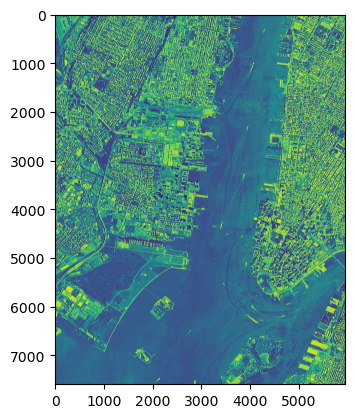

In [35]:
band1 = dataset.read(1)

# plot image
plt.imshow(band1)

## Lab 3 Exercise 2

### Check Meta Data for Raster Data

In [36]:
# Replaced with Hoboken NAIP tile
naip_file = 'cir-naip-hw/nj_m_4007424_ne_18_1_20170719_20171102.tif'
naip_dataset = rio.open(naip_file)
naip_bounds = naip_dataset.bounds
naip_bounds

BoundingBox(left=578842.0, bottom=4504190.0, right=584799.0, top=4511787.0)

In [37]:
# this shows the crs for the naip files
naip_dataset.crs

CRS.from_epsg(26918)

In [38]:
naip_dataset.meta

{'driver': 'GTiff',
 'dtype': 'uint8',
 'nodata': None,
 'width': 5957,
 'height': 7597,
 'count': 4,
 'crs': CRS.from_epsg(26918),
 'transform': Affine(1.0, 0.0, 578842.0,
        0.0, -1.0, 4511787.0)}

### Read geotiff files using specified bands

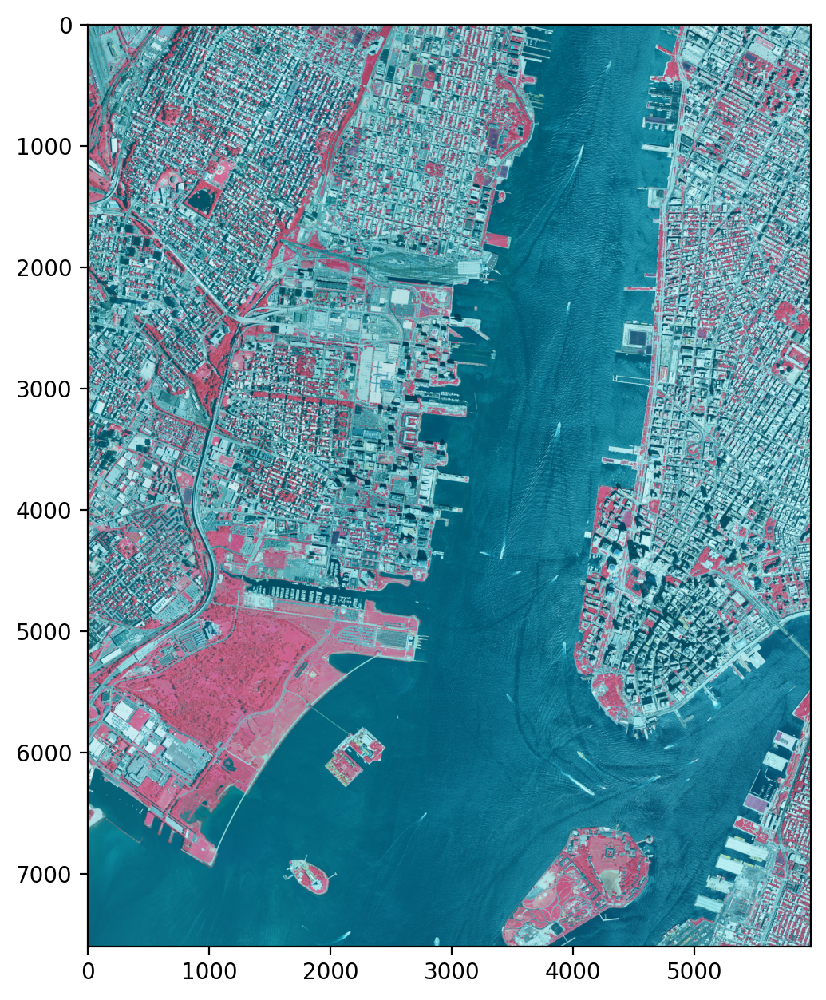

In [39]:
naip_dataset = rio.open(naip_file)

# read the different bands of the raster datam
nir = np.float32(naip_dataset.read(4))
blue = np.float32(naip_dataset.read(3))
green = np.float32(naip_dataset.read(2))
red = np.float32(naip_dataset.read(1))


# stack different layer images
# This stacks the near infra-red layer on top of red and green. Red replaces green and Green replaces blue.
cir = np.dstack((nir,red,green))


# plt.imshow(band1)
plt.figure(figsize=(7.5, 7.5), dpi=200)
plt.imshow(cir.astype(np.uint8))

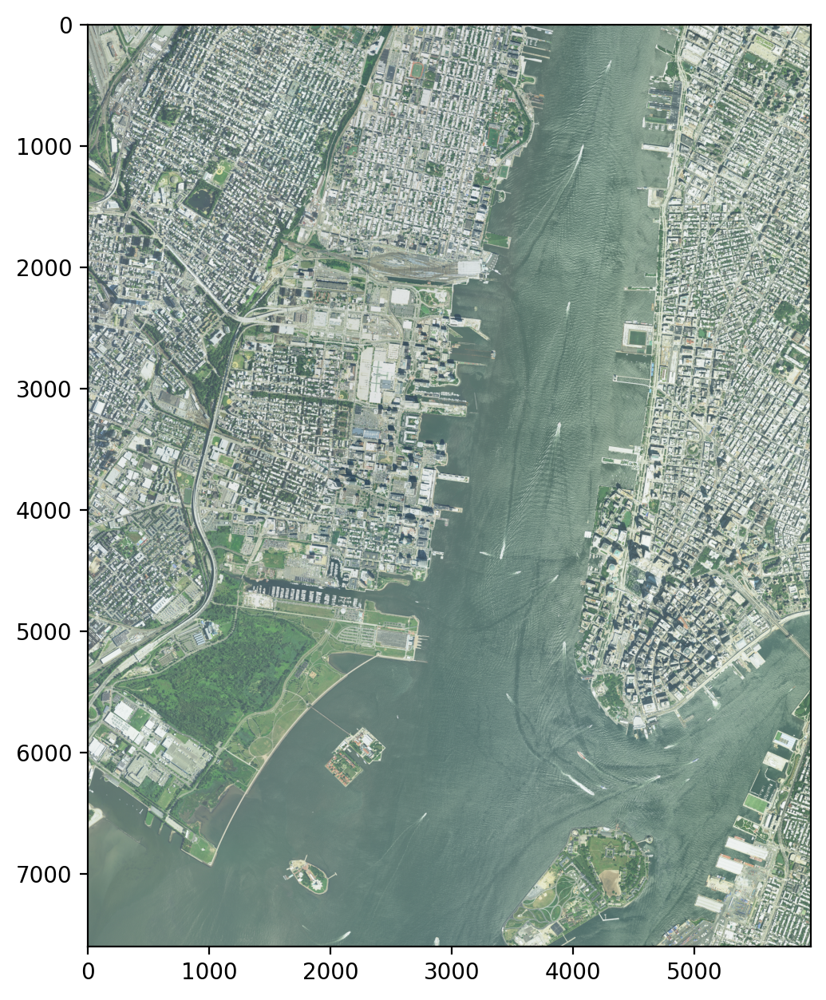

In [40]:
# This is stacking the layers in RGB - for how images typically look
cir = np.dstack((red,green,blue))

# plt.imshow(band1)
plt.figure(figsize=(7.5, 7.5), dpi=200)
plt.imshow(cir.astype(np.uint8))

Resampling to 3798,2978


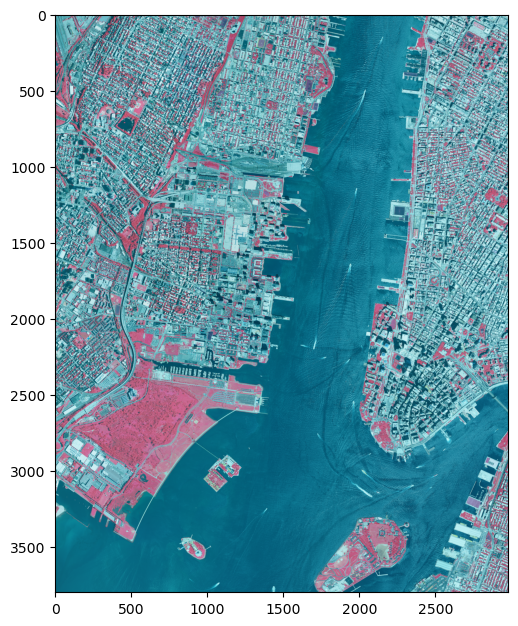

In [41]:
# Display NAIP Image
def display_naip_tile(filename, dsfactor = 2):
    """
    Display a NAIP tile using rasterio.
    
    dsfactor: downsample factor
    For .mrf-formatted tiles (which span multiple files), 'filename' should refer to the 
    .mrf file.
    """
    
    # NAIP tiles are enormous; downsize for plotting in this notebook
    
    with rasterio.open(filename) as raster:
        # rasterio uses 1-based indexing for channels.
        h = int(raster.height/dsfactor)
        w = int(raster.width/dsfactor)
        print('Resampling to {},{}'.format(h,w))
        ir = raster.read(4, out_shape=(1, h, w))
        r = raster.read(1, out_shape=(1, h, w))
        g = raster.read(2, out_shape=(1, h, w))
        
    cir = np.dstack((ir,r,g))
    fig = plt.figure(figsize=(7.5, 7.5), dpi=100, edgecolor='k')
    plt.imshow(cir)
    raster.close()
    
naip_file = 'cir-naip-hw/nj_m_4007424_ne_18_1_20170719_20171102.tif'
display_naip_tile(naip_file)

### Calculate NDVI from NAIP

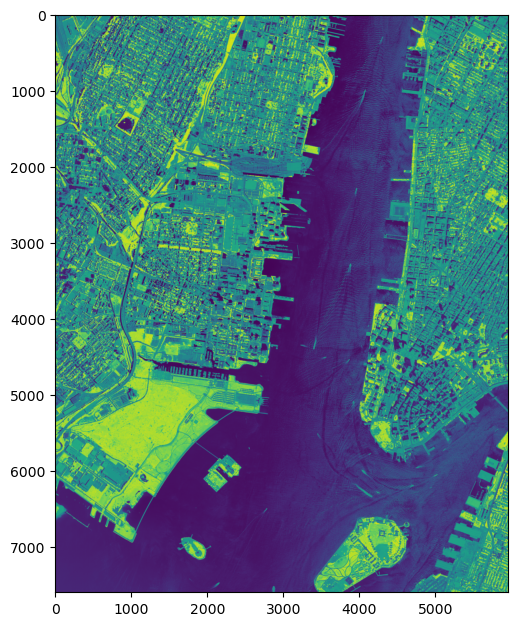

In [42]:
# here add 0.0000001 is to make sure the nir+red is not zero
ndvi = (nir - red)/(nir + red + 0.000001)

plt.figure(figsize=(7.5, 7.5))
plt.imshow(ndvi)

In [43]:
# check the statistics of the calcualted NDVI images
ndvi.max()

0.5151515

### Extract Vegetation from NAIP

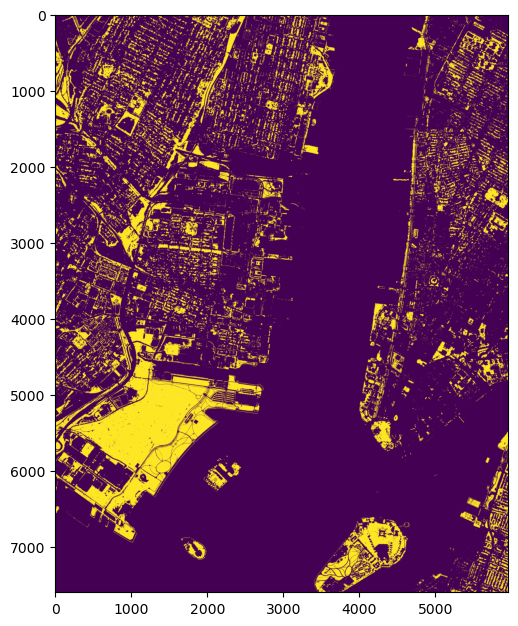

In [45]:
plt.figure(figsize=(7.5, 7.5))

# This creates an empty array, then fills it with values for when ndvi > 0; this will create a binary image 0 and 1 values only
# 0 = No vegetation, 1 = Vegetation
veg = np.zeros((ndvi.shape[0], ndvi.shape[1]), dtype = np.uint16)
veg[ndvi > 0] = 1

plt.imshow(veg)

### Save new raster as TIFF

In [46]:
# This is the output name (changed for hw output)
out_tif = 'data/veg_hw.tif'

# prepare the schema of the new tiles
out_meta = naip_dataset.meta.copy()

# In this case, the metadata will show that there 4 bands (shown in count), but we only want 1 band
out_meta

{'driver': 'GTiff',
 'dtype': 'uint8',
 'nodata': None,
 'width': 5957,
 'height': 7597,
 'count': 4,
 'crs': CRS.from_epsg(26918),
 'transform': Affine(1.0, 0.0, 578842.0,
        0.0, -1.0, 4511787.0)}

In [47]:
# Update the schema of the ndvi image because it is different from the raw naip image, like only one band
out_meta.update({'count': 1,
                'dtype': 'uint16',
                 "height": ndvi.shape[0],
                 "width": ndvi.shape[1],
#                  "transform": out_transform,
                 "crs": naip_dataset.crs, 
                 'compress': 'lzw'}
               )

In [48]:
# this is required, because rio will use three dimension, even this is single band image
veg = veg.reshape(1, veg.shape[0], veg.shape[1])

with rio.open(out_tif, "w", **out_meta) as dest:
    dest.write(veg)

## Lab 3 Exercise 3

In [68]:
# This function is used to mosaic geotiffs in the input folder
# Parameters:
#     dirpath: the folder name of the tif files
#     outfile: the output file of the mosaiced geotiff image


# mosaicRasters(folder, os.path.join(root, 'naip-atlanta.tif'))
# updating the input folder to where the Hoboken tif files are located
inputfolder= 'cir-naip-hw'
outfile = 'data/mosaiced-naip.tif'

# start to mosaic the raster tiles
tiflist = []

for file in os.listdir(inputfolder):    
    if file.endswith('.tif'):
        tiffile = os.path.join(inputfolder, file)
        tiflist.append(tiffile)

# The try and except makes sure that the code is robust
# The command will continue to execute, even if one of the tiff file is corrupt
src_files_to_mosaic = []
for fp in tiflist:
    try:
        tile_src = rasterio.open(fp)
        tile_bounds = tile_src.bounds
        
        src_files_to_mosaic.append(tile_src)
    except:
        continue

print('The number of mosaiced tiles is:', len(src_files_to_mosaic))

# the method can be set as min, max..
mosaic, out_trans = merge(src_files_to_mosaic) #, method='max'
print('You have mosaiced the results')


# Prepare the schema of the output mosaiced image
# Compress lzw is a popular method to compress the file size into something more manageable
out_meta = tile_src.meta.copy()
out_meta.update({"driver": "GTiff",
                  "height": mosaic.shape[1],
                  "width": mosaic.shape[2],
                  "transform": out_trans, 
                  "compress": 'lzw',
                  'BIGTIFF': 'YES'
                  }
               )

#out_fp = os.path.join(dirpath, 'atlanta-naip.tif')
with rasterio.open(outfile, "w", **out_meta) as dest:
     dest.write(mosaic)

The number of mosaiced tiles is: 2
You have mosaiced the results


### Check Projections

In [62]:
# Read the spatial data
city_boundary = gpd.read_file("data/Hoboken_Boundary/Hoboken_Boundary.shp")
census_boundary = gpd.read_file("data/Hoboken_Boundary/hoboken_census_tracts.shp")

# Checking the projection for the raster files
tiffile = 'cir-naip-hw/nj_m_4007424_ne_18_1_20170719_20171102.tif'
dataset = rio.open(tiffile)

print("The projection for city boundary is:", city_boundary.crs)
print("The projection for census tract boundaries are:", census_boundary.crs)
print("The projection for naip images are:", dataset.crs)

The projection for city boundary is: EPSG:3424
The projection for census tract boundaries are: EPSG:3424
The projection for naip images are: EPSG:26918


Because the prokections for the city and census tract boundaries are not the same as the naip images, I will change the projection of the shapefiles, since it is less complicated, to match the naip images.

In [64]:
# Change projections of the city_boundary and census_boundary to ESPG:26918
city_boundary_reprj = city_boundary.to_crs(epsg=26918)
census_boundary_reprj = census_boundary.to_crs(epsg=26918)

# Check that the projections were changed
print("The projection for city boundary is:", city_boundary_reprj.crs)
print("The projection for census tract boundaries are:", census_boundary_reprj.crs)

The projection for city boundary is: EPSG:26918
The projection for census tract boundaries are: EPSG:26918


In [70]:
# Now that the city_boundary_reprj and census_boundary_reprj are in the correct projection, we must save them as a shapefile
city_boundary_reprj.to_file("data/city_boundary_reprj.shp")
census_boundary_reprj.to_file("data/census_boundary_reprj.shp")

### Mask Mosaic to Hoboken 

In [77]:
# File paths updated to use the reprojected boundaries
city_boundary_shp = "data/city_boundary_reprj.shp"
input_raster = "data/mosaiced-naip.tif"
output_raster = "data/mask-Hoboken-naip.tif"

# Extract geometries from the shapefile
# open the shape file in "read" mode and extract the geometry from city_boundary
with fiona.open(city_boundary_shp, "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# Open the inuput_raster, mask it, and prepare the metadata for output
with rasterio.open(input_raster) as src:
    out_image, out_transform = mask(src, shapes, crop=True)
    out_meta = src.meta.copy()
    out_meta.update({
        "driver": "GTiff",
        "height": out_image.shape[1],
        "width": out_image.shape[2],
        "transform": out_transform
    })

# Save the masked raster by "writing" a new file using the metadata
with rasterio.open(output_raster, "w", **out_meta) as dest:
    dest.write(out_image)

### Clip large raster data to smaller tiles

In [79]:
# Updated accordingly to match existing file paths
lu_dataset = rasterio.open('data/mask-Hoboken-naip.tif')
outfolder = 'data/naip-tiles'
if not os.path.exists(outfolder):
    os.mkdir(outfolder)


lu_img = lu_dataset.read()

# height and width of the raster
height, width = lu_dataset.shape

# split the large raser into number of tiles, tile size is 200*200
# reduced the tile size because the study area is small!
tile_width = 200
tile_height = 200

tile_num_col = int(width/tile_width) + 1
tile_num_row = int(height/tile_height) + 1

# the output folder
if not os.path.exists(outfolder): os.mkdir(outfolder)

# create each tile
for i in range(tile_num_row - 1):
    # loop each column
    for j in range(tile_num_col - 1):
        print('The i and j is:', i, j)
        tilename = os.path.join(outfolder, 'row%s-col%s.tif'%(i, j))
        
        row_start = i*tile_height
        col_start = j*tile_width
        row_end = (i + 1)*tile_height
        col_end = (j + 1)*tile_width
        
        # deal with the right boundary
        if row_end > height - 1: tile_height = height - row_start
        if col_end > width - 1: tile_width = width - col_start
        
        # window = get_data_window(lu_dataset.read(1, masked=True))
        window = Window(col_off=col_start, row_off=row_start, width=tile_width, height=tile_height)
        
        kwargs = lu_dataset.meta.copy()
        kwargs.update({
            'height': window.height,
            'width': window.width,
            'transform': rasterio.windows.transform(window, lu_dataset.transform)})
        
        with rasterio.open(tilename, 'w', **kwargs) as dst:
            dst.write(lu_dataset.read(window=window))

The i and j is: 0 0
The i and j is: 0 1
The i and j is: 0 2
The i and j is: 0 3
The i and j is: 0 4
The i and j is: 0 5
The i and j is: 0 6
The i and j is: 0 7
The i and j is: 0 8
The i and j is: 1 0
The i and j is: 1 1
The i and j is: 1 2
The i and j is: 1 3
The i and j is: 1 4
The i and j is: 1 5
The i and j is: 1 6
The i and j is: 1 7
The i and j is: 1 8
The i and j is: 2 0
The i and j is: 2 1
The i and j is: 2 2
The i and j is: 2 3
The i and j is: 2 4
The i and j is: 2 5
The i and j is: 2 6
The i and j is: 2 7
The i and j is: 2 8
The i and j is: 3 0
The i and j is: 3 1
The i and j is: 3 2
The i and j is: 3 3
The i and j is: 3 4
The i and j is: 3 5
The i and j is: 3 6
The i and j is: 3 7
The i and j is: 3 8
The i and j is: 4 0
The i and j is: 4 1
The i and j is: 4 2
The i and j is: 4 3
The i and j is: 4 4
The i and j is: 4 5
The i and j is: 4 6
The i and j is: 4 7
The i and j is: 4 8
The i and j is: 5 0
The i and j is: 5 1
The i and j is: 5 2
The i and j is: 5 3
The i and j is: 5 4


In [80]:
# updated file to match
out_tif = 'data/veg_hw.tif'

infolder = 'data/naip-tiles'
outfolder = 'data/veg-tiles'

if not os.path.exists(outfolder):
    os.mkdir(outfolder)


for file in os.listdir(infolder):
    tiffile = os.path.join(infolder, file)
    
    # read the different bands of the raster data
    if not tiffile.endswith('.tif'): continue
    naip_dataset = rio.open(tiffile)
    green = np.float32(naip_dataset.read(3))
    red = np.float32(naip_dataset.read(2))
    nir = np.float32(naip_dataset.read(1))

    # here add 0.0000001 is to make sure the nir+red is not zero
    ndvi = (nir - red)/(nir + red + 0.000001)
    
    # extract the vegetation based on the ndvi
    veg = np.zeros((ndvi.shape[0], ndvi.shape[1]), dtype = np.uint16)
    veg[ndvi > 0] = 1
    
    
    # prepare the schema of the new tiles
    out_meta = naip_dataset.meta.copy()

    # update the schema of the ndvi image, because it is different from teh raw naip image, like only one band
    out_meta.update({'count': 1,
                    'dtype': 'uint16',
                     "height": ndvi.shape[0],
                     "width": ndvi.shape[1],
    #                  "transform": out_transform,
                     "crs": naip_dataset.crs, 
                     'compress': 'lzw'}
                   )
    
    
    # this is required, because rio will use three dimension, even this is single band image
    veg = veg.reshape(1, veg.shape[0], veg.shape[1])
    
    out_tif = os.path.join(outfolder, file)
    with rio.open(out_tif, "w", **out_meta) as dest:
        dest.write(veg)
    

### Overlay shapefile on raster data

In [89]:
# This is the NAIP image (with NIR and red bands) masked to Hoboken
inraster = 'data/mask-Hoboken-naip.tif'
input_zone_polygon = 'data/census_boundary_reprj.shp'
# The output file with the NDVI data will be stored
output_shp_res = 'data/vegCoverCensus-tract.shp'

# Open the raster datasets
naip_dataset = rasterio.open(inraster)

# Prepare the polygon shapefile and then do the overlay of the raster data and the vector data
lyr = fiona.open(input_zone_polygon)
schema = lyr.schema
schema['properties']['ndvi'] = 'float'


with fiona.open(output_shp_res, 'w', driver = "ESRI Shapefile", crs = lyr.crs, schema=schema) as output:
    for idx, feat in enumerate(lyr):
        props = feat['properties']
        geom = feat['geometry']
        shape = [geom] # the rasterio need the list, therefore, create a list
        
        # mask the raster using the polygon
        outNAIP_image, out_transform = rasterio.mask.mask(naip_dataset, shape, 
                                                          nodata = 0,
                                                          crop=True)
        
        # calculate the ndvi from the clipped naip img, convert the int to float using numpy
        nir = np.float32(outNAIP_image[0, :, :])
        red = np.float32(outNAIP_image[1, :, :])
        ndvi = (nir - red)/(nir + red + 0.000001)
        
        # calculate the ndvi value
        mean_val = np.sum(ndvi)/np.count_nonzero(ndvi)
        
        # update the calculated ndvi value to the field
        props['ndvi'] = mean_val
        output.write({'properties': props,
                      'geometry': geom
                     })

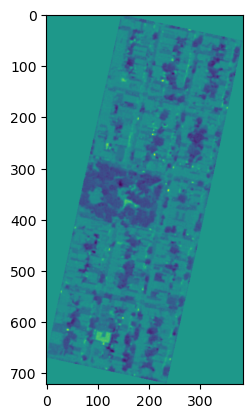

In [93]:
# check the bands to make sure that band color is correct. 
plt.imshow(nir - red)

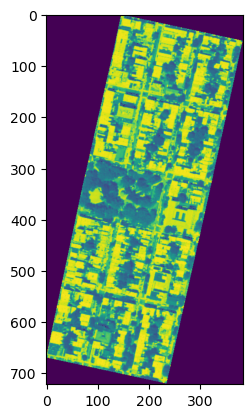

In [91]:
plt.imshow(outNAIP_image[0,:,:])

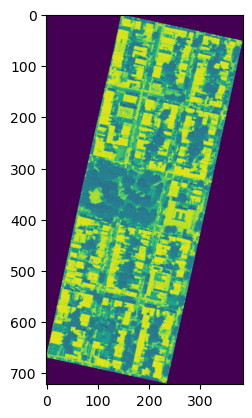

In [92]:
plt.imshow(outNAIP_image[2,:,:])